In [1]:
import os
import sys  
sys.path.insert(0, '../')

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as ss
import json

from tqdm import tqdm

In [2]:
plt.rcParams["axes.labelsize"] = 16. 
plt.rcParams["xtick.labelsize"] = 14. 
plt.rcParams["ytick.labelsize"] = 14. 
plt.rcParams["legend.fontsize"] = 12. 
plt.rcParams["figure.figsize"] = [13., 5.]

---------

Import data

In [3]:
sales_train_df = pd.read_csv('data/sales_train.csv')
sales_test_df = pd.read_csv('data/test.csv')
items_df = pd.read_csv('data/items.csv')
item_categories_df = pd.read_csv('data/item_categories.csv')
shops_df = pd.read_csv('data/shops.csv')
sample_submission_df = pd.read_csv('data/sample_submission.csv')

In [4]:
sales_train_df.head(4)

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
0,02.01.2013,0,59,22154,999.00,1.0
1,03.01.2013,0,25,2552,899.00,1.0
2,05.01.2013,0,25,2552,899.00,-1.0
3,06.01.2013,0,25,2554,1709.05,1.0


In [5]:
sales_test_df.head()

,ID,shop_id,item_id
0,0,5,5037
1,1,5,5320
2,2,5,5233
3,3,5,5232
4,4,5,5268


In [6]:
items_df.head(4)

,item_name,item_id,item_category_id
0,! ВО ВЛАСТИ НАВАЖДЕНИЯ (ПЛАСТ.) D,0,40
1,!ABBYY FineReader 12 Professional Edition Full...,1,76
2,***В ЛУЧАХ СЛАВЫ (UNV) D,2,40
3,***ГОЛУБАЯ ВОЛНА (Univ) D,3,40


In [7]:
item_categories_df.head(4)

,item_category_name,item_category_id
0,PC - Гарнитуры/Наушники,0
1,Аксессуары - PS2,1
2,Аксессуары - PS3,2
3,Аксессуары - PS4,3


In [8]:
shops_df.head(4)

,shop_name,shop_id
0,"!Якутск Орджоникидзе, 56 фран",0
1,"!Якутск ТЦ ""Центральный"" фран",1
2,"Адыгея ТЦ ""Мега""",2
3,"Балашиха ТРК ""Октябрь-Киномир""",3


In [9]:
sample_submission_df.head(4)

,ID,item_cnt_month
0,0,0.5
1,1,0.5
2,2,0.5
3,3,0.5


---------

### Item_id basic statistics:

In [10]:
sch_train = 0
for v in tqdm(sales_test_df.item_id.unique()):
    if v not in sales_train_df.item_id.values:
        sch_train+=1
        
sch_test = 0
for v in tqdm(sales_train_df.item_id.unique()):
    if v not in sales_test_df.item_id.values:
        sch_test+=1

100%|██████████████████████████████████| 21807/21807 [00:02<00:00, 10451.01it/s]


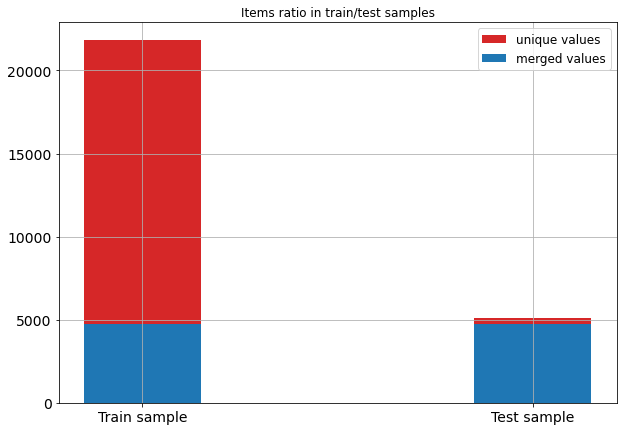

In [11]:
train_df_ids = sales_train_df.item_id.nunique()
test_df_ids = sales_test_df.item_id.nunique()

plt.figure(figsize=(10, 7))
plt.bar([1, 2], [train_df_ids, test_df_ids], color = 'C3', width = 0.3, label = 'unique values')
plt.bar([1, 2], [train_df_ids-sch_test, test_df_ids-sch_train], color = 'C0', width = 0.3, label = 'merged values')
plt.title('Items ratio in train/test samples')
plt.xticks([1, 2], ['Train sample', 'Test sample'])
plt.legend()
plt.grid()
plt.show()

There are a lot unique values in train sample. Also, there are unique values in the test sample too (around 7%).  

----------

### Lets check tables about unique values

In [12]:
print(set(sorted(list(sales_test_df.shop_id.value_counts().keys()))))
print('')
print(set(sorted(list(sales_train_df.shop_id.value_counts().keys()))))

{2, 3, 4, 5, 6, 7, 10, 12, 14, 15, 16, 18, 19, 21, 22, 24, 25, 26, 28, 31, 34, 35, 36, 37, 38, 39, 41, 42, 44, 45, 46, 47, 48, 49, 50, 52, 53, 55, 56, 57, 58, 59}

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59}


As we can see, in train df we have shops which not represented in test_dataset

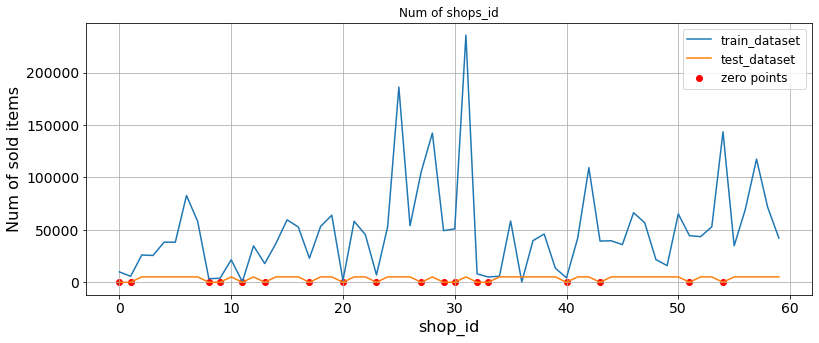

In [13]:
train_shops = [sales_train_df[sales_train_df.shop_id==t].shape[0] for t in range(60)]
test_shops = [sales_test_df[sales_test_df.shop_id==t].shape[0] for t in range(60)]

plt.plot(train_shops, label = 'train_dataset')
plt.plot(test_shops, label = 'test_dataset')
plt.scatter(list(set(sorted(list(sales_train_df.shop_id.value_counts().keys())))-set(sorted(list(sales_test_df.shop_id.value_counts().keys())))), 
           [0 for _ in range(18)], color = 'red', label = 'zero points')
plt.title('Num of shops_id')
plt.xlabel('shop_id')
plt.ylabel('Num of sold items')
plt.grid()
plt.legend()
plt.show()

In [14]:
zero_arr = list(
    set(sorted(list(sales_train_df.shop_id.value_counts().keys()))
       )-set(
        sorted(list(sales_test_df.shop_id.value_counts().keys())))
        )
num_points_in_zero_arrs = np.sum([sales_train_df[sales_train_df.shop_id==k].shape[0] for k in zero_arr])
num_points_in_zero_arrs/sales_train_df.shape[0]

0.17800745201813853

We have 17 zero-points shops. But can we see, theese shops account around 18% from total volume.

------------

Items array are not same too

In [15]:
sorted(set(sales_test_df.item_id.values))==sorted(set(sales_train_df.item_id.values))

False

In [16]:
test_vals_1 = sorted(set(sales_test_df.item_id.values))
train_vals_1 = sorted(set(sales_train_df.item_id.values))
print('Num of ebsent items: ', len(train_vals_1) - len(test_vals_1))
print('Share of ebsent unique items: ', (len(train_vals_1) - len(test_vals_1))/len(set(sales_train_df.item_id.values) - set(sales_test_df.item_id.values)))

Num of ebsent items:  16707
Share of ebsent unique items:  0.9787346221441124


As we can see, a low of items are epsent in dataset.

--------
### Next, lets aggregate our data to appropriate type

In [17]:
item_df = items_df.merge(item_categories_df)
item_df.head()

,item_name,item_id,item_category_id,item_category_name
0,! ВО ВЛАСТИ НАВАЖДЕНИЯ (ПЛАСТ.) D,0,40,Кино - DVD
1,***В ЛУЧАХ СЛАВЫ (UNV) D,2,40,Кино - DVD
2,***ГОЛУБАЯ ВОЛНА (Univ) D,3,40,Кино - DVD
3,***КОРОБКА (СТЕКЛО) D,4,40,Кино - DVD
4,***НОВЫЕ АМЕРИКАНСКИЕ ГРАФФИТИ (UNI) ...,5,40,Кино - DVD


In [18]:
sales_train_df = sales_train_df.merge(item_df)
sales_train_df.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,item_category_name
0,02.01.2013,0,59,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
1,23.01.2013,0,24,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
2,20.01.2013,0,27,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
3,02.01.2013,0,25,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
4,03.01.2013,0,25,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray


Lets check which shops price changing the most:

In [19]:
item_price_stats = sales_train_df.groupby('item_id').agg(
    {'item_price': ['mean', 'std']}
).fillna(0).reset_index()
item_price_stats.columns=['item_id', 'item_price_mean', 'item_price_std']
item_price_stats.head()

shop_id_stats = sales_train_df.groupby(['shop_id', 'item_id']).agg({'item_price': list}).reset_index()

shop_id_stats = shop_id_stats.merge(item_price_stats)
shop_id_stats.head()

,shop_id,item_id,item_price,item_price_mean,item_price_std
0,0,30,"[265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265...",323.679206,105.936668
1,1,30,"[265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265.0]",323.679206,105.936668
2,2,30,"[359.0, 399.0, 169.0, 169.0]",323.679206,105.936668
3,3,30,"[399.0, 399.0, 399.0, 399.0, 399.0, 399.0, 399...",323.679206,105.936668
4,4,30,"[399.0, 399.0, 399.0, 399.0, 399.0, 399.0, 399...",323.679206,105.936668


In [20]:
item_price_stats_1 = sales_train_df.groupby(['date','item_category_id']).agg(
    {'item_price': ['mean', min, max]}
).reset_index()
item_price_stats_1['date'] = pd.to_datetime(item_price_stats_1['date'])
item_price_stats_1.sort_values(by = 'date', inplace = True)
item_price_stats_1.columns=(['date', 'item_category_id', 'item_price_mean', 
                            'item_price_min', 'item_price_max'])
item_price_stats_1.head()

,date,item_category_id,item_price_mean,item_price_min,item_price_max
0,2013-01-01,2,2032.917143,699.0,5485.89
27,2013-01-01,56,1149.000000,1149.0,1149.00
28,2013-01-01,57,347.678571,110.0,2499.00
29,2013-01-01,58,1174.000000,1099.0,1249.00
30,2013-01-01,59,445.428571,169.0,1399.00


In [21]:
price_arr_mean_1 = [[item_price_stats_1[
    (item_price_stats_1.date == dd) & (item_price_stats_1.item_category_id == idd)
]['item_price_mean'].values.sum() for dd in item_price_stats_1.date.unique()] for idd in range(80)]

price_arr_min_1 = [[item_price_stats_1[
    (item_price_stats_1.date == dd) & (item_price_stats_1.item_category_id == idd)
]['item_price_min'].values.sum() for dd in item_price_stats_1.date.unique()] for idd in range(80)]

price_arr_max_1 = [[item_price_stats_1[
    (item_price_stats_1.date == dd) & (item_price_stats_1.item_category_id == idd)
]['item_price_max'].values.sum()for dd in item_price_stats_1.date.unique()] for idd in range(80)]

In [22]:
shops_by_dates = sales_train_df.groupby(['date', 'shop_id']).agg({'item_cnt_day': sum}).reset_index()
shops_by_dates['date'] = pd.to_datetime(shops_by_dates['date'])
shops_by_dates.sort_values(by = 'date', inplace = True)
shops_by_dates.head()

,date,shop_id,item_cnt_day
0,2013-01-01,2,24.0
16,2013-01-01,54,415.0
15,2013-01-01,51,136.0
14,2013-01-01,46,97.0
13,2013-01-01,42,118.0


In [23]:
shops_count_arr = [[
                        shops_by_dates[
                            (shops_by_dates.date==dd)& (shops_by_dates.shop_id==val)
                        ]['item_cnt_day'].sum() for dd in shops_by_dates.date.unique()
                    ] for val in range(80)]

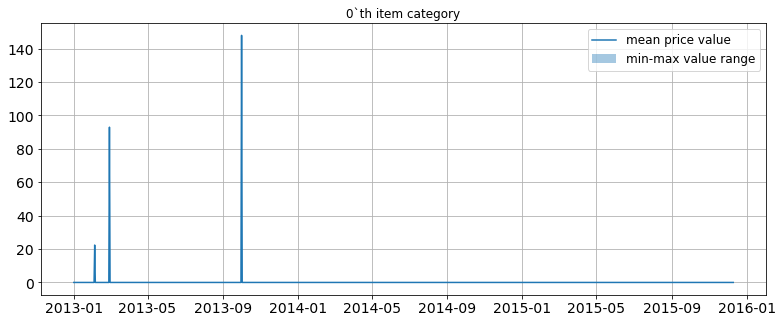

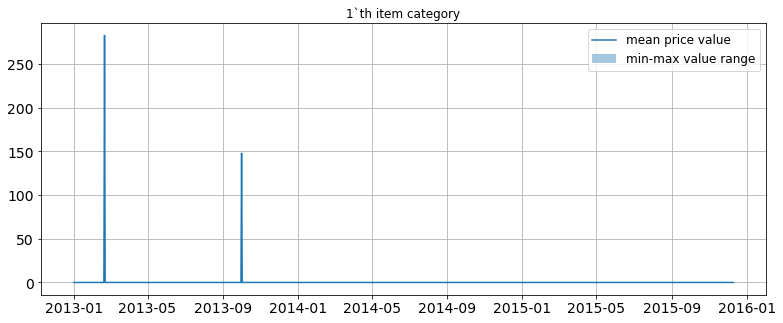

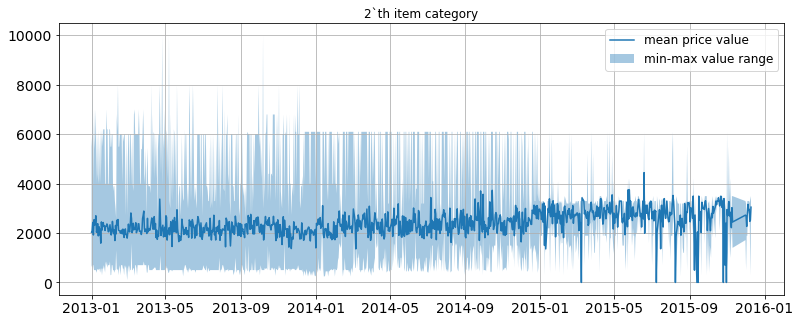

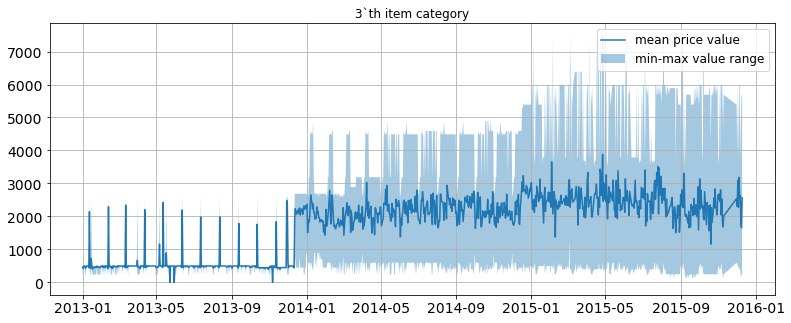

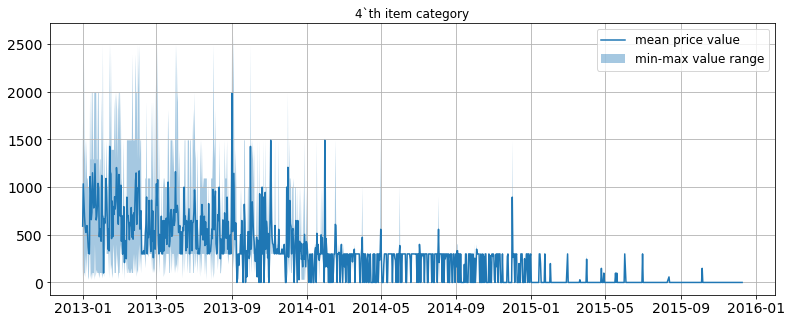

...

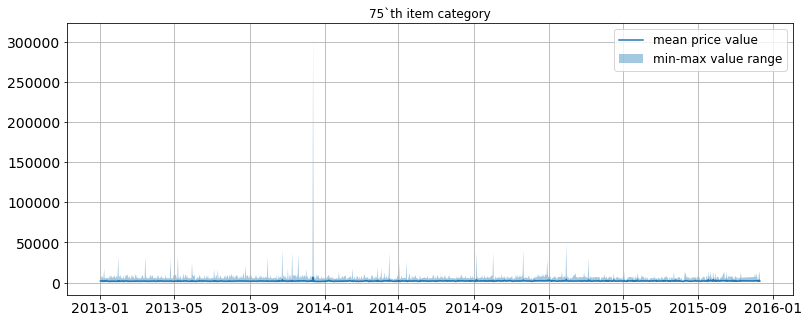

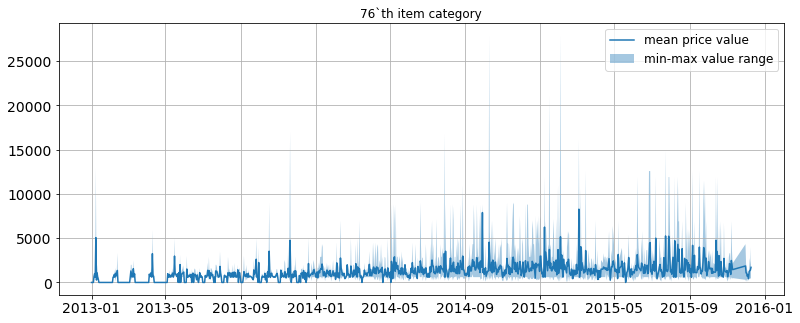

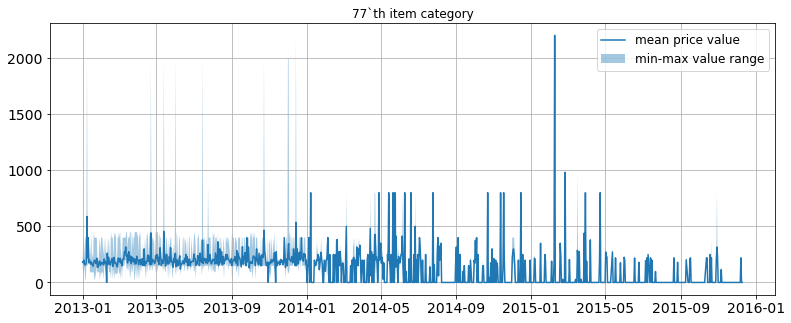

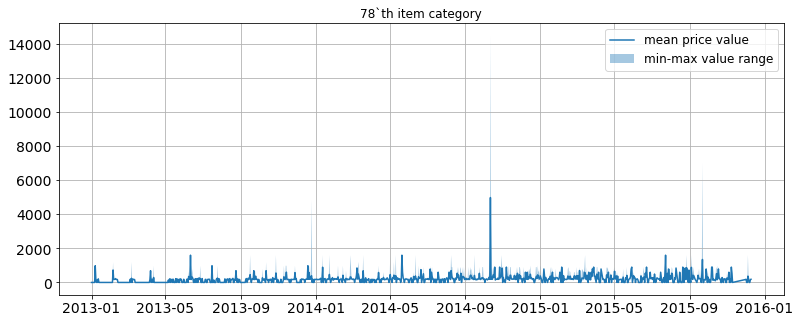

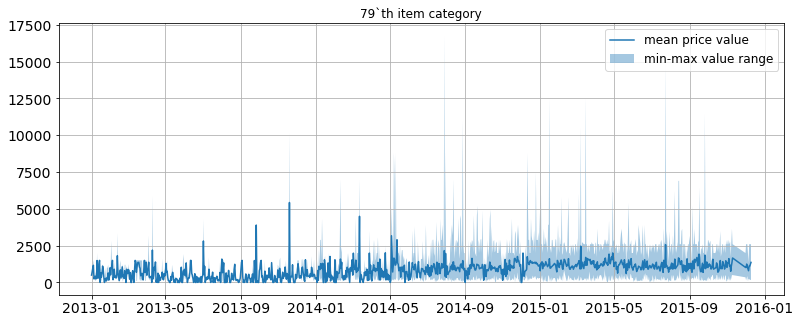

In [24]:
for k in range(80):
    plt.plot(shops_by_dates.date.unique(), price_arr_mean_1[k], label = 'mean price value')
    plt.fill_between(shops_by_dates.date.unique(), price_arr_max_1[k], price_arr_min_1[k], 
                     facecolor='C0', alpha=0.4, label = 'min-max value range')
    plt.title(str(k)+'`th item category')
    plt.legend()
    plt.grid()
    plt.show()

In [25]:
prices_chan = sales_train_df.groupby(['item_category_id']).agg({'item_price': [min, max, 'mean', 'std']}).reset_index()
prices_chan.columns = ['item_category_id', 'min_val', 'max_val', 'mean_val', 'std']
prices_chan.sort_values(by = 'mean_val', inplace = True)
prices_chan.head()

,item_category_id,min_val,max_val,mean_val,std
71,71,1.83,28.0,4.931371,0.606930
50,50,17.00,24.0,20.500000,4.949747
82,82,13.00,70.0,32.481014,17.040604
66,66,15.00,210.0,76.778940,42.959877
0,0,22.40,148.0,87.800000,62.961258


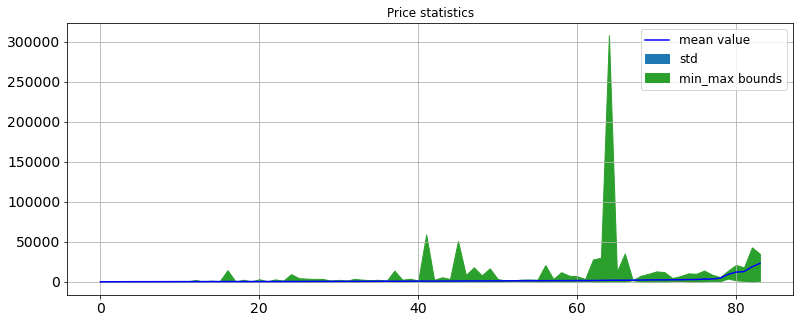

In [26]:
plt.plot(prices_chan['mean_val'].values, color = 'b', label = 'mean value')
plt.fill_between(np.arange(84), prices_chan['mean_val'] + prices_chan['std'], 
                prices_chan['mean_val'] - prices_chan['std'], color = 'C0', label = 'std')
plt.fill_between(np.arange(84), prices_chan['max_val'], 
                prices_chan['min_val'], color = 'C2', label = 'min_max bounds')
plt.grid()
plt.title('Price statistics')
plt.legend()
plt.show()

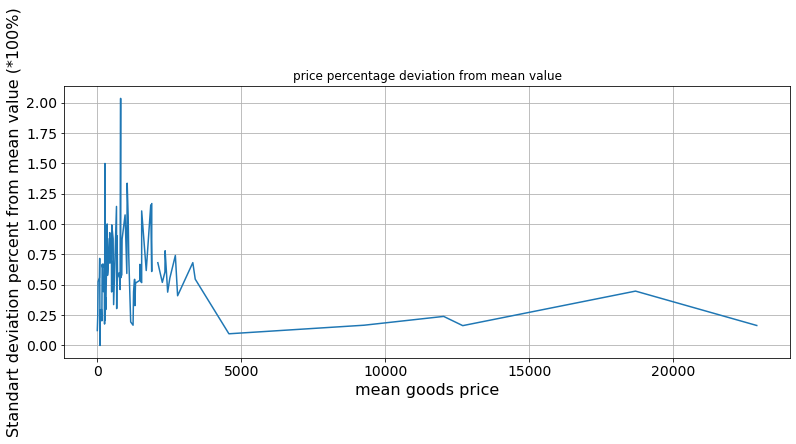

In [27]:
plt.plot(prices_chan['mean_val'], prices_chan['std']/prices_chan['mean_val'])
plt.title('price percentage deviation from mean value')
plt.xlabel('mean goods price')
plt.ylabel('Standart deviation percent from mean value (*100%)')
plt.grid()
plt.show()

In [28]:
sales_train_df

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,item_category_name
0,02.01.2013,0,59,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
1,23.01.2013,0,24,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
2,20.01.2013,0,27,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
3,02.01.2013,0,25,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
4,03.01.2013,0,25,22154,999.0,1.0,ЯВЛЕНИЕ 2012 (BD),37,Кино - Blu-Ray
...,...,...,...,...,...,...,...,...,...
2935844,17.10.2015,33,25,8428,249.0,1.0,"АХ, ВОДЕВИЛЬ, ВОДЕВИЛЬ (rem)",40,Кино - DVD
2935845,01.10.2015,33,25,7903,12198.0,1.0,XBOX 360 S 250GB CONSOLE/KINECT BUNDLE KUNG FU...,15,Игровые консоли - XBOX 360
2935846,29.10.2015,33,25,7610,2890.0,1.0,WARHAMMER ACCESSORIES: Khorne Dice арт. 65-13,64,Подарки - Настольные игры
2935847,22.10.2015,33,25,7635,2100.0,1.0,WARHAMMER MINIATURES: Dark Elf Doomfire Warloc...,64,Подарки - Настольные игры


In [29]:
threshold_vals = [1, 2, 5, 10, 50, 100, 500, 1000, 5000, 10000, 50000, 100000, 1000000]
mean_count_arr = [
    sales_train_df[sales_train_df.item_price<threshold_vals[0]].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[1])& (sales_train_df.item_price>threshold_vals[0])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[2])& (sales_train_df.item_price>threshold_vals[1])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[3])& (sales_train_df.item_price>threshold_vals[2])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[4])& (sales_train_df.item_price>threshold_vals[3])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[5])& (sales_train_df.item_price>threshold_vals[4])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[6])& (sales_train_df.item_price>threshold_vals[5])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[7])& (sales_train_df.item_price>threshold_vals[6])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[8])& (sales_train_df.item_price>threshold_vals[7])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[9])& (sales_train_df.item_price>threshold_vals[8])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[10])& (sales_train_df.item_price>threshold_vals[9])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[11])& (sales_train_df.item_price>threshold_vals[10])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price<threshold_vals[12])& (sales_train_df.item_price>threshold_vals[11])].item_cnt_day.mean(),
    sales_train_df[(sales_train_df.item_price>threshold_vals[12])].item_cnt_day.mean(),
]

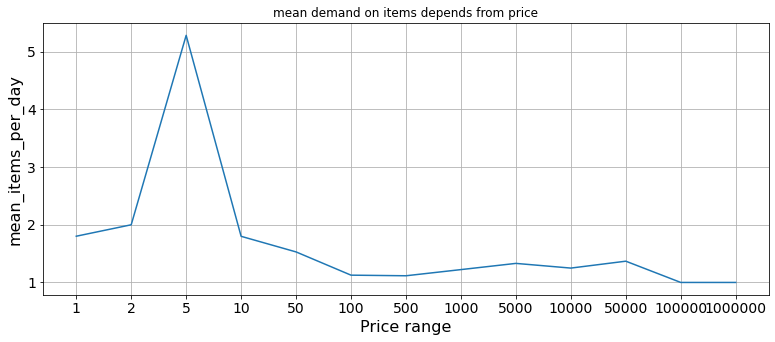

In [30]:
plt.plot(mean_count_arr)
plt.title('mean demand on items depends from price')
plt.ylabel('mean_items_per_day')
plt.xticks(np.arange(13), threshold_vals)
plt.xlabel('Price range')
plt.grid()
plt.show()

As we can see, the lower the price of a product, the greater the relative deviation from the average price is observed in it.

Here we can check standart deviations by items:

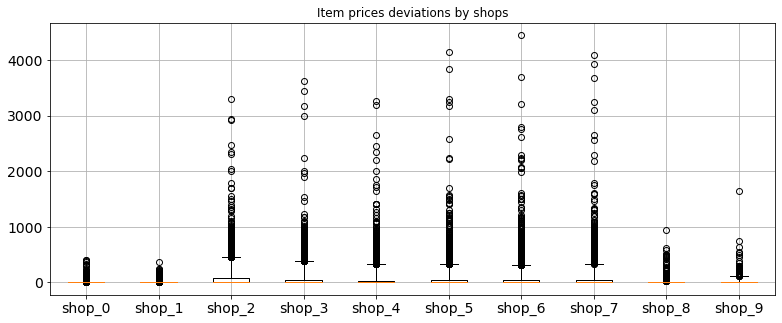

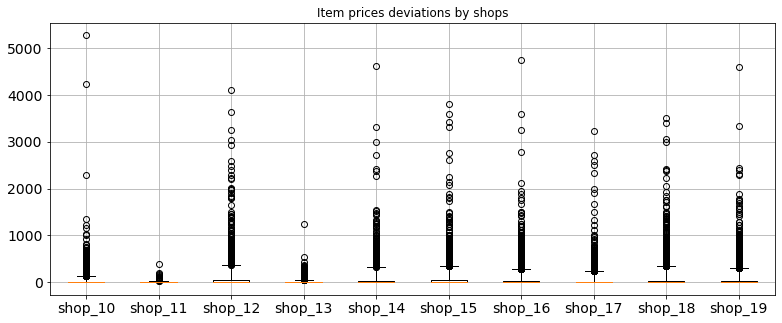

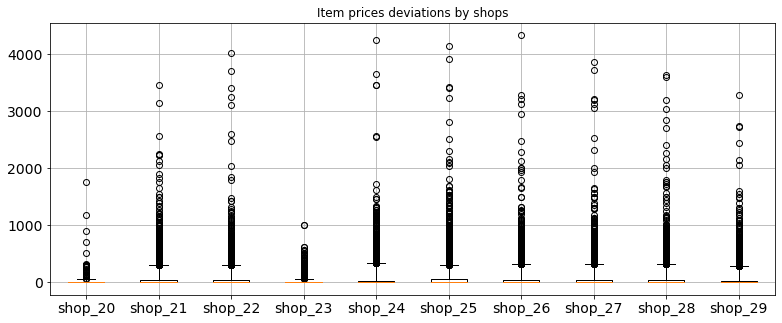

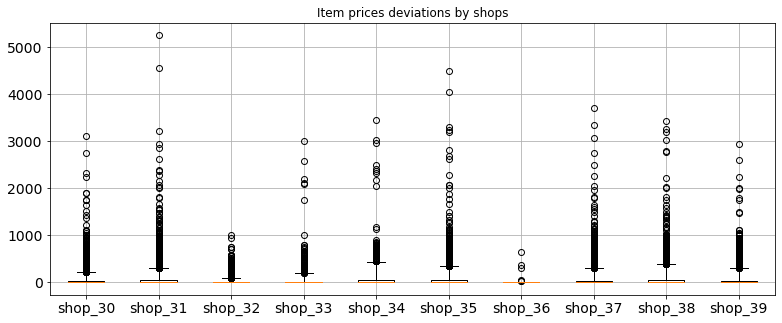

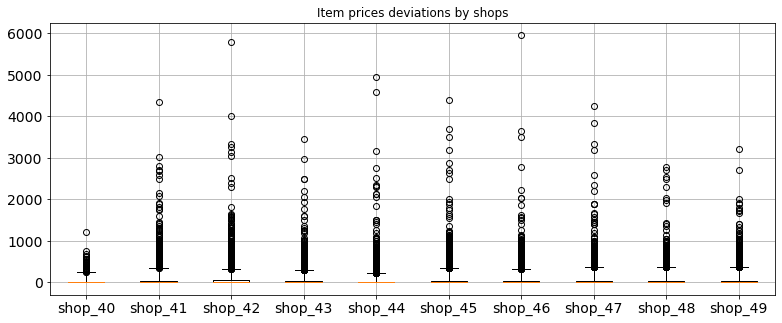

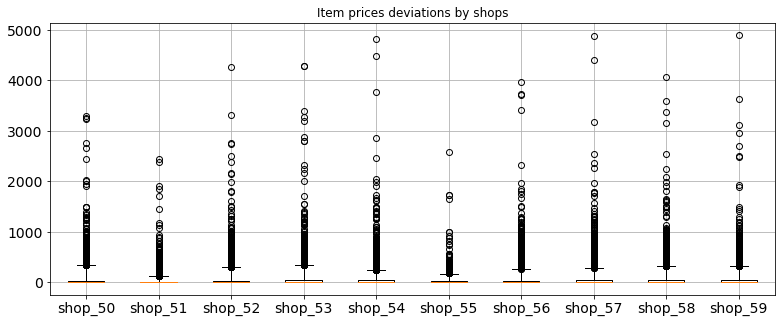

In [31]:
boxplots_arr = [
    shop_id_stats[shop_id_stats.shop_id==k].item_price.apply(lambda x: np.std(x)) for k in range(60)
]

plt.boxplot(boxplots_arr[:10], positions = np.arange(10), 
            labels = ['shop_'+str(k) for k in range(10)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

plt.boxplot(boxplots_arr[10:20], positions = np.arange(10, 20), 
            labels = ['shop_'+str(k) for k in range(10, 20)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

plt.boxplot(boxplots_arr[20:30], positions = np.arange(20, 30), 
            labels = ['shop_'+str(k) for k in range(20, 30)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

plt.boxplot(boxplots_arr[30:40], positions = np.arange(30, 40), 
            labels = ['shop_'+str(k) for k in range(30, 40)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

plt.boxplot(boxplots_arr[40:50], positions = np.arange(40, 50), 
            labels = ['shop_'+str(k) for k in range(40, 50)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

plt.boxplot(boxplots_arr[50:60], positions = np.arange(50, 60), 
            labels = ['shop_'+str(k) for k in range(50, 60)], 
            whis = (5, 95))
plt.title('Item prices deviations by shops')
plt.grid()
plt.show()

Lets check their percentage num:

In [32]:
boxplots_percents_arr = [sum(
    shop_id_stats[shop_id_stats.shop_id==k].item_price.apply(lambda x: np.std(x))>0
)/shop_id_stats[shop_id_stats.shop_id==k].shape[0] for k in range(60)]

Some shops can be labeled as floating-price stores, and some stores can be called fixed-price stores.

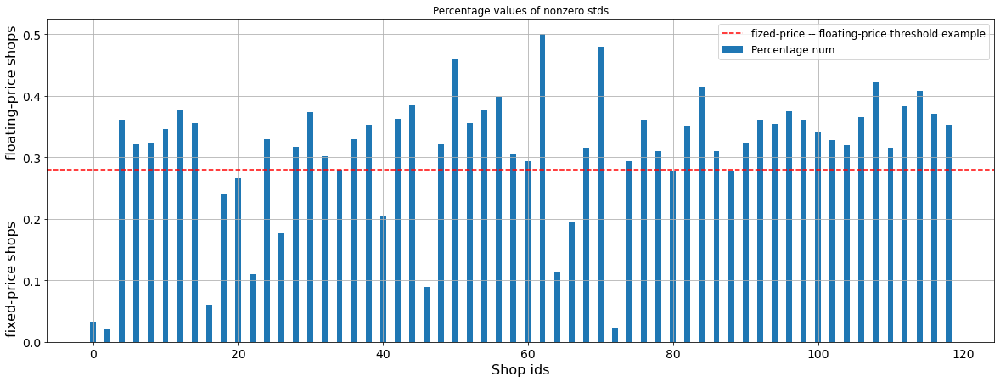

In [33]:
plt.figure(figsize=(20, 7))
plt.bar(np.arange(len(boxplots_percents_arr))*2, boxplots_percents_arr, label = 'Percentage num')
# 0.28 as an example value
plt.axhline(y=0.28, color='r', linestyle='--', label = 'fized-price -- floating-price threshold example')
plt.title('Percentage values of nonzero stds')
plt.ylabel('fixed-price shops              floating-price shops')
plt.xlabel('Shop ids')
plt.legend()
plt.grid()
plt.show()

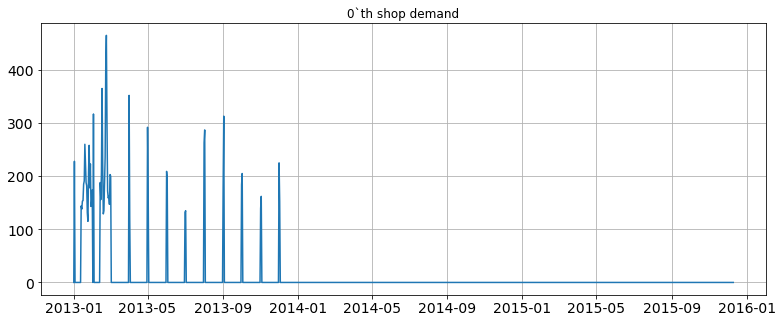

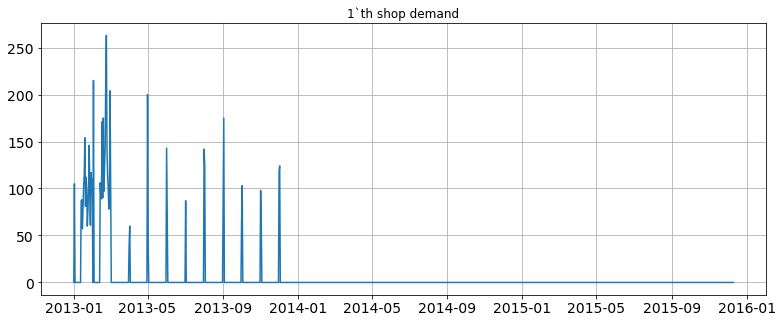

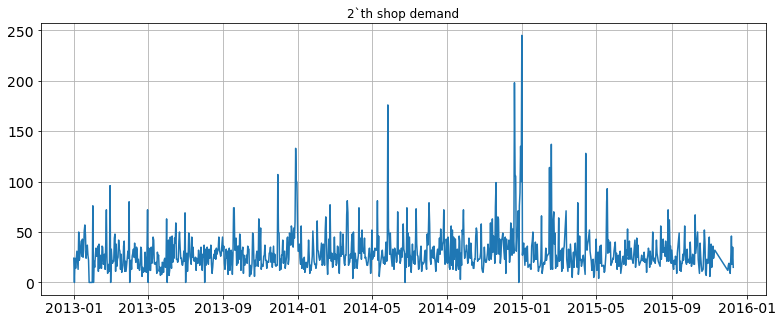

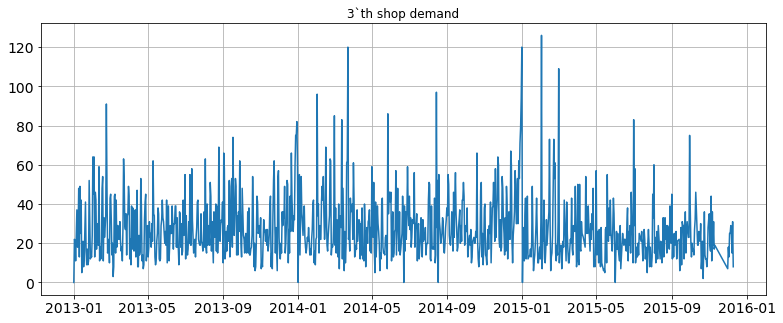

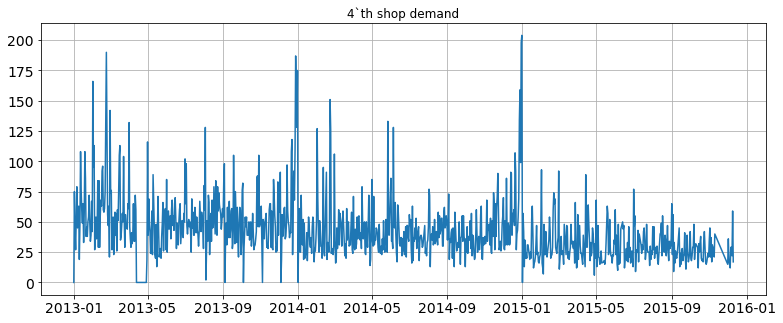

...

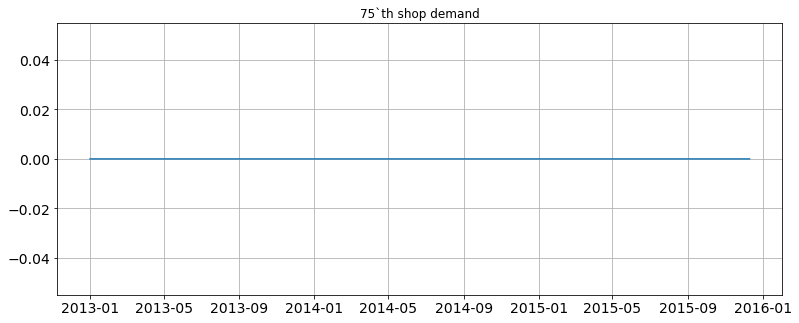

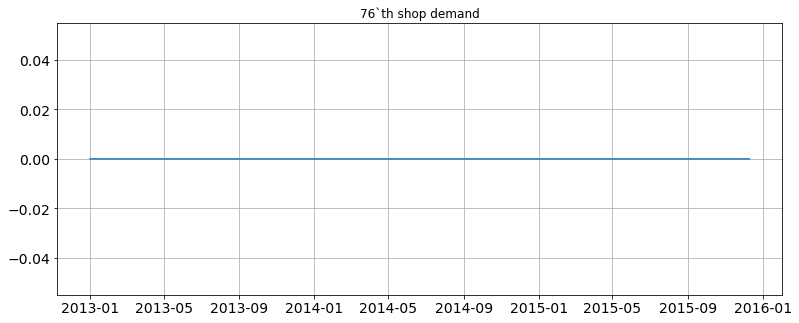

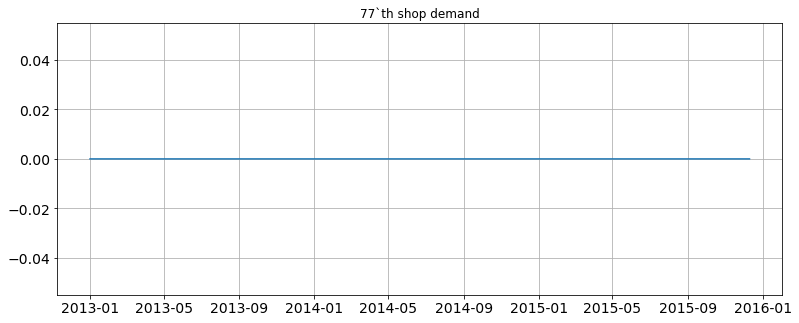

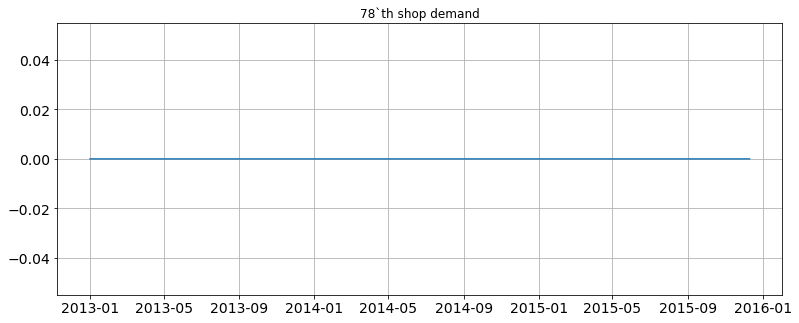

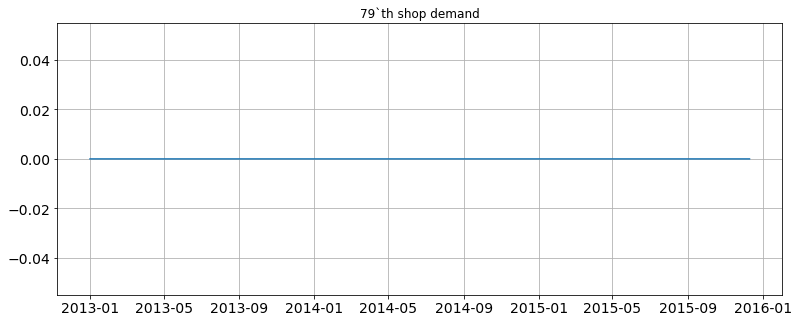

In [34]:
for k in range(80):
    plt.plot(shops_by_dates.date.unique(), shops_count_arr[k])
    plt.title(str(k)+'`th shop demand')
    plt.grid()
    plt.show()

As we can see, some shops tend to have a trend, o seasonal components. Some stores are not selling goods all the time, but started and finished selling them during the specified period.  

Also we not have any information about several dates. Hence, we can replace these values with zeros.

-----------

Lets check some statistics for data item categories. Perhaps, we will see some interesting things too

In [35]:
item_price_stats = sales_train_df.groupby('item_id').agg(
    {'item_price': ['mean', 'std']}
).fillna(0).reset_index()
item_price_stats.columns=['item_id', 'item_price_mean', 'item_price_std']
item_price_stats.head()

category_id_stats = sales_train_df.groupby(['item_category_id', 'item_id']).agg({'item_price': list}).reset_index()

category_id_stats = category_id_stats.merge(item_price_stats)
category_id_stats.head()

,item_category_id,item_id,item_price,item_price_mean,item_price_std
0,0,16255,[93.0],93.0,0.0
1,0,16256,[22.4],22.4,0.0
2,0,16257,[148.0],148.0,0.0
3,1,5606,[148.0],148.0,0.0
4,1,5740,[283.0],283.0,0.0


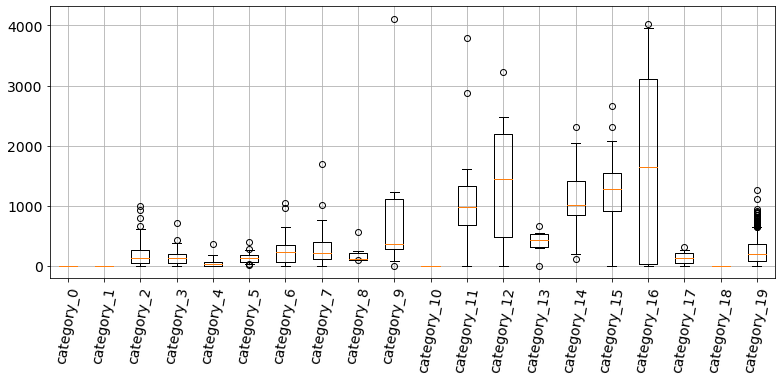

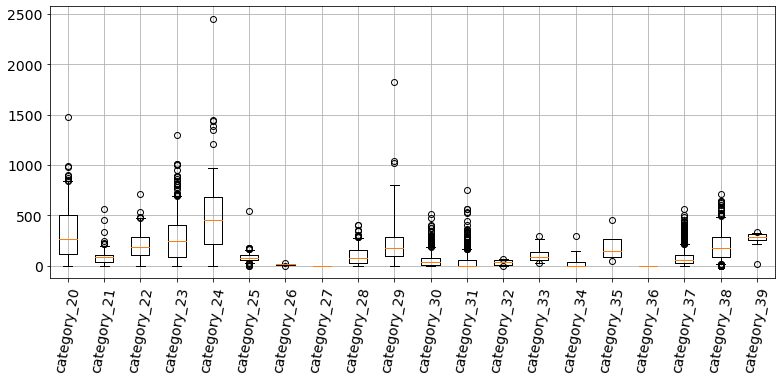

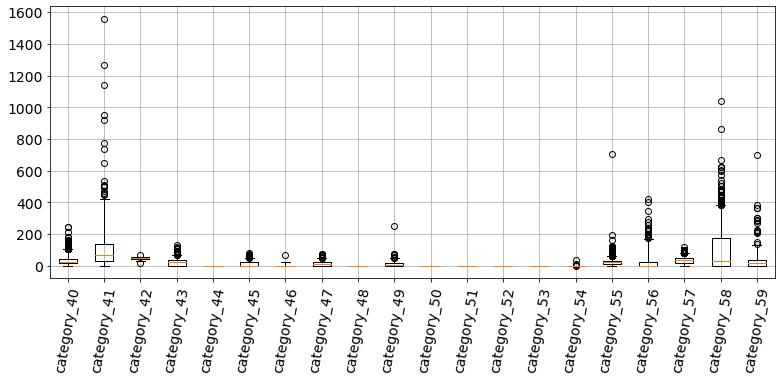

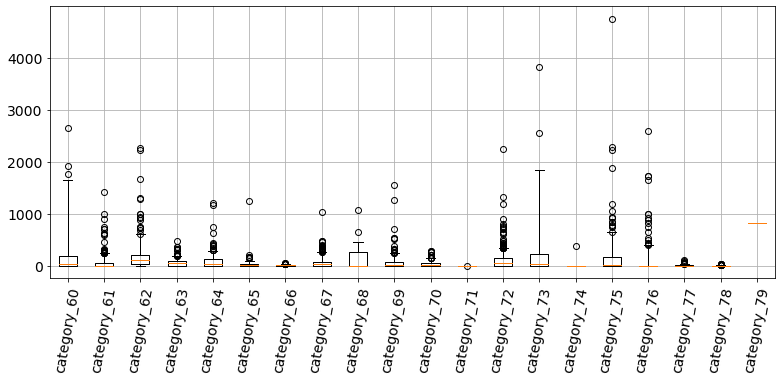

In [36]:
boxplots_arr = [
    category_id_stats[category_id_stats.item_category_id==k].item_price.apply(lambda x: np.std(x)) for k in range(80)
]

plt.boxplot(boxplots_arr[:20], positions = np.arange(20), 
            labels = ['category_'+str(k) for k in range(20)], 
            whis = (5, 95))
plt.grid()
plt.xticks(rotation = 80)
plt.show()

plt.boxplot(boxplots_arr[20:40], positions = np.arange(20, 40), 
            labels = ['category_'+str(k) for k in range(20, 40)], 
            whis = (5, 95))
plt.grid()
plt.xticks(rotation = 80)
plt.show()

plt.boxplot(boxplots_arr[40:60], positions = np.arange(40, 60), 
            labels = ['category_'+str(k) for k in range(40, 60)], 
            whis = (5, 95))
plt.grid()
plt.xticks(rotation = 80)
plt.show()

plt.boxplot(boxplots_arr[60:80], positions = np.arange(60, 80), 
            labels = ['category_'+str(k) for k in range(60, 80)], 
            whis = (5, 95))
plt.grid()
plt.xticks(rotation = 80)
plt.show()

There are much more good's types which have nonzero mean value. Therefore, the intensity of price changes is more influenced by the type of product than the name of the store.

------------

Lets check temporal price changing:

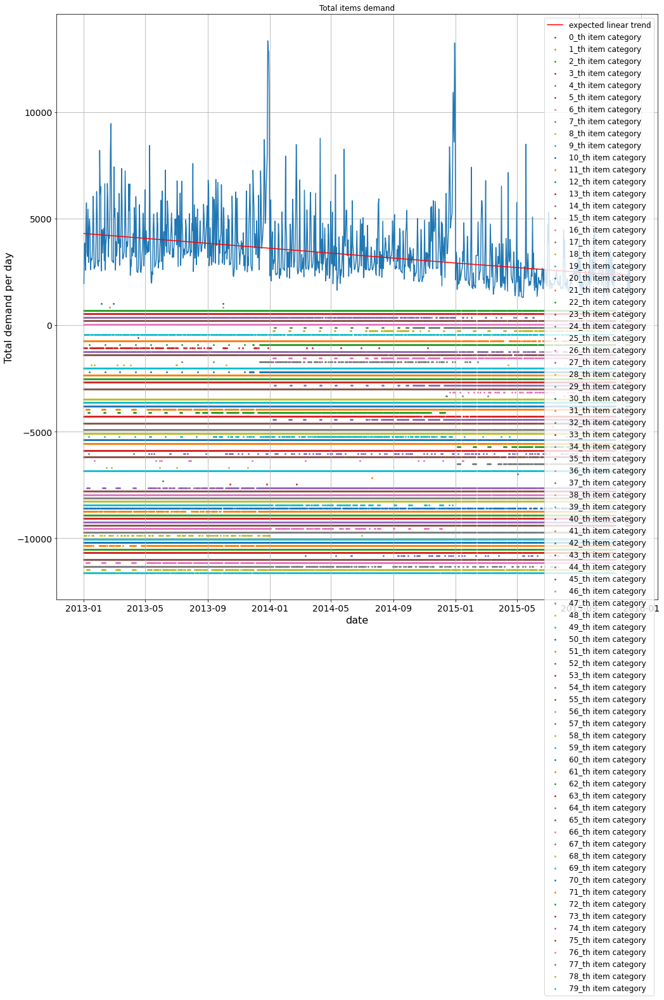

In [37]:
plt.figure(figsize = (17, 17))

sales_count_sum = sales_train_df.groupby('date').agg(
    {'item_cnt_day': sum, 'item_category_id': list}
).reset_index()
sales_count_sum['date'] = pd.to_datetime(sales_count_sum['date'])
sales_count_sum.sort_values(by = 'date', inplace = True)

plt.plot(sales_count_sum.date, sales_count_sum.item_cnt_day)
plt.plot(sales_count_sum.date, np.linspace(sales_count_sum.item_cnt_day.iloc[:100].mean(), 
            sales_count_sum.item_cnt_day.iloc[-30:].mean(), 
            sales_count_sum.item_cnt_day.shape[0]), label = 'expected linear trend', color = 'r')

for i in range(80):
    plt.scatter(sales_count_sum[
        [i in k for k in sales_count_sum['item_category_id']]
    ].date, 
                [
                    1000-160*i for _ in range(
                        sales_count_sum[
                            [i in k for k in sales_count_sum['item_category_id']]
                        ].shape[0]
                    )
                ], label = str(i)+'_th item category', s = 3.5)
    
plt.title('Total items demand')
plt.ylabel('Total demand per day')
plt.xlabel('date')
plt.legend()
plt.grid()
plt.show()

Here we can see obvious seasonality. Also we can highlight a trend.  
Also we see, thats some categories of goods are rarely sold, or have ceased to be sold at all.  
Lets check sales of each product in more detail:

In [38]:
item_categ_id = sales_train_df.groupby(['date', 'item_category_id']).agg({'item_cnt_day': sum}).reset_index()
item_categ_id['date'] = pd.to_datetime(item_categ_id['date'])
item_categ_id.sort_values(by = 'date', inplace = True)

category_id_arr = [[
                        item_categ_id[
                            (item_categ_id.date==dd)& (item_categ_id.item_category_id==val)
                        ]['item_cnt_day'].sum() for dd in item_categ_id.date.unique()
                    ] for val in range(80)]

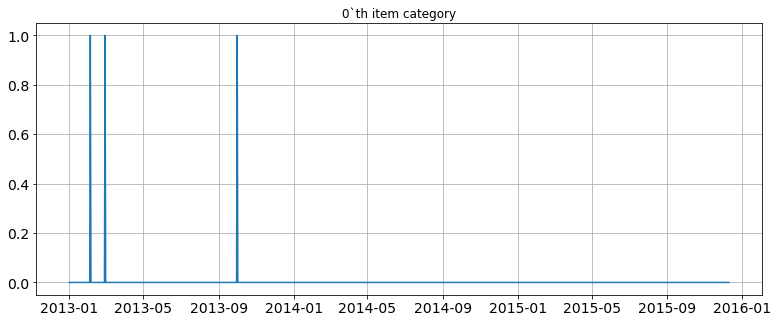

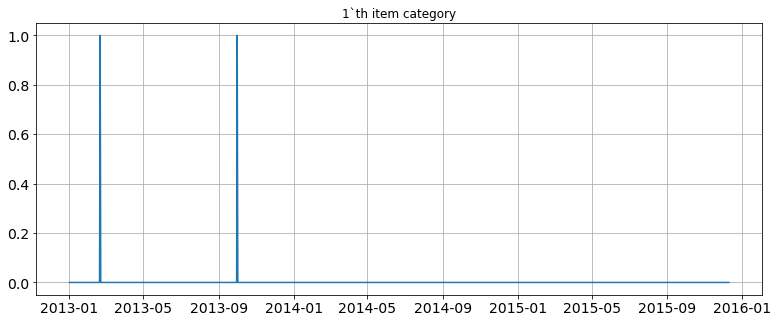

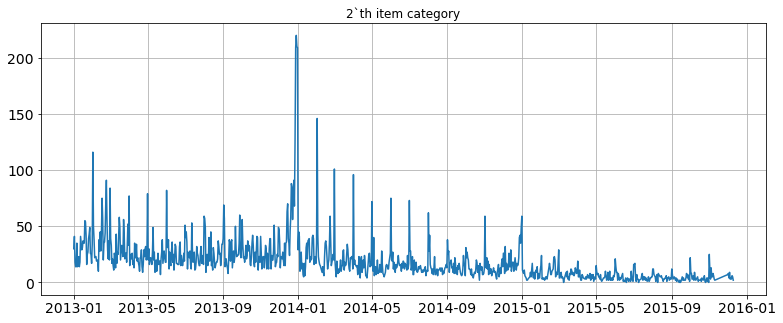

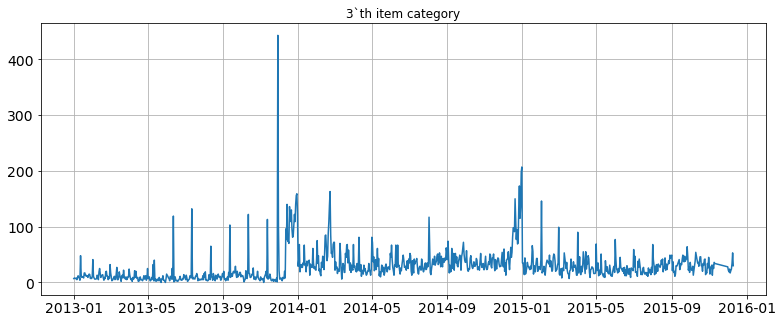

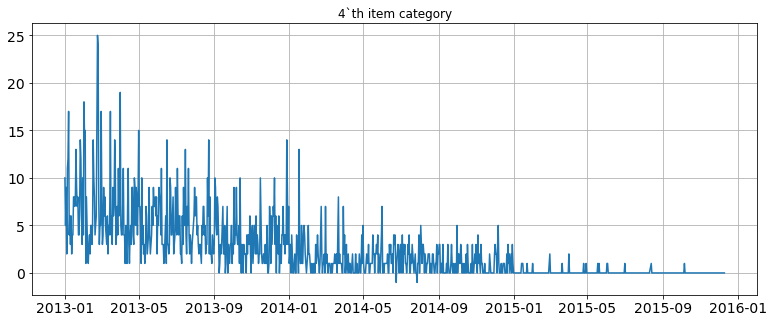

...

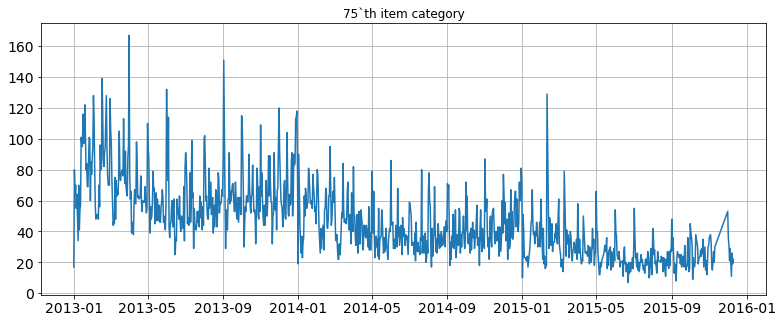

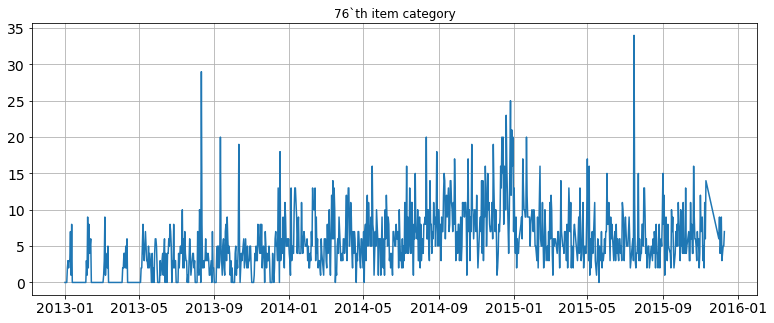

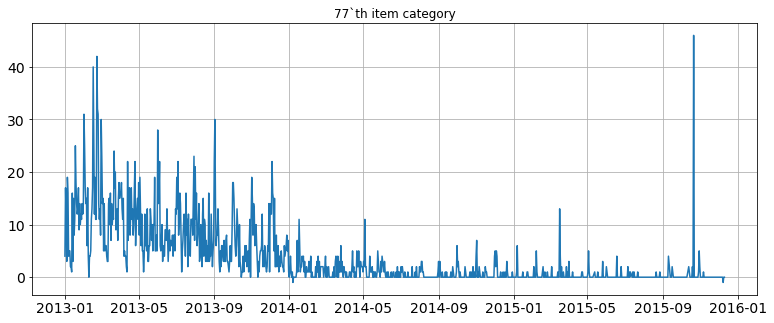

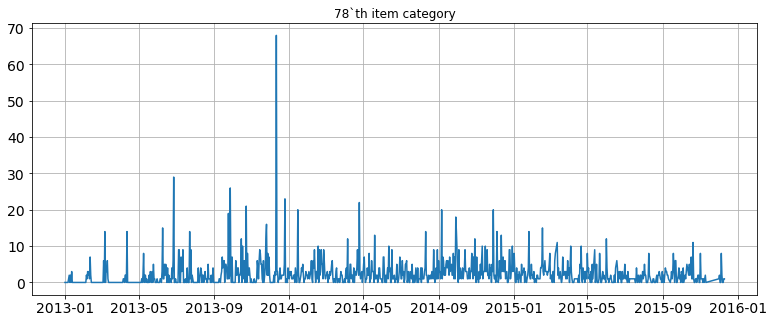

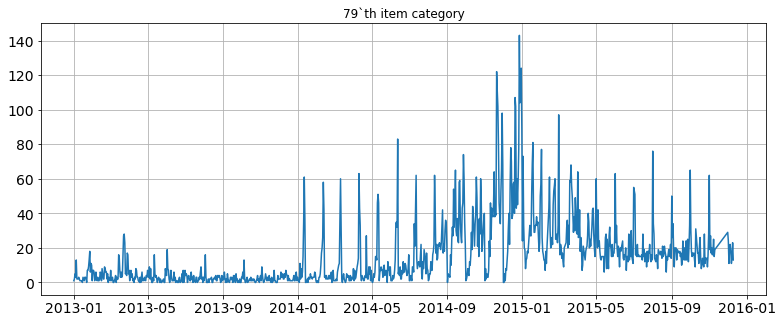

In [39]:
for k in range(80):
    plt.plot(item_categ_id.date.unique(), category_id_arr[k])
    plt.title(str(k)+'`th item category')
    plt.grid()
    plt.show()

Here we can see same situation as with shop's demand. There is seasonality by day of week, months and seasons too. Also we can highlight some times as days before christmas, holydays,  etc.

-------

Lets see on data values

Check values for each item_id

In [40]:
sales_train_df.describe()

,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_category_id
count,2.935849e+06,2.935849e+06,2.935849e+06,2.935849e+06,2.935849e+06,2.935849e+06
mean,1.456991e+01,3.300173e+01,1.019723e+04,8.908532e+02,1.242641e+00,4.000138e+01
std,9.422988e+00,1.622697e+01,6.324297e+03,1.729800e+03,2.618834e+00,1.710076e+01
min,0.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,-2.200000e+01,0.000000e+00
25%,7.000000e+00,2.200000e+01,4.476000e+03,2.490000e+02,1.000000e+00,2.800000e+01
50%,1.400000e+01,3.100000e+01,9.343000e+03,3.990000e+02,1.000000e+00,4.000000e+01
75%,2.300000e+01,4.700000e+01,1.568400e+04,9.990000e+02,1.000000e+00,5.500000e+01
max,3.300000e+01,5.900000e+01,2.216900e+04,3.079800e+05,2.169000e+03,8.300000e+01


In [41]:
# Lets check one of the most popular items
sales_train_df.item_id.value_counts()

20949    31340
5822      9408
17717     9067
2808      7479
4181      6853
         ...  
579          1
19388        1
19326        1
6992         1
7640         1
Name: item_id, Length: 21807, dtype: int64

-------

### Lets check first data visualization

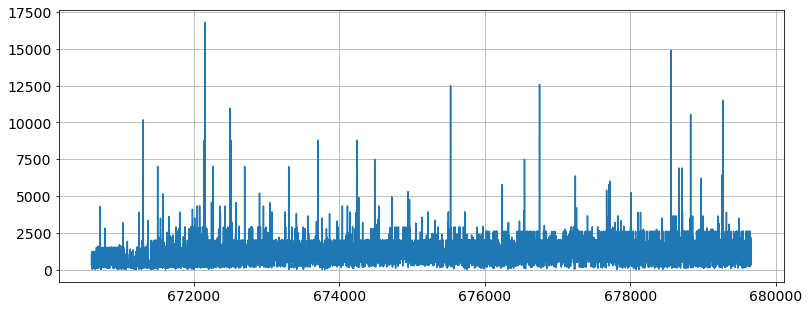

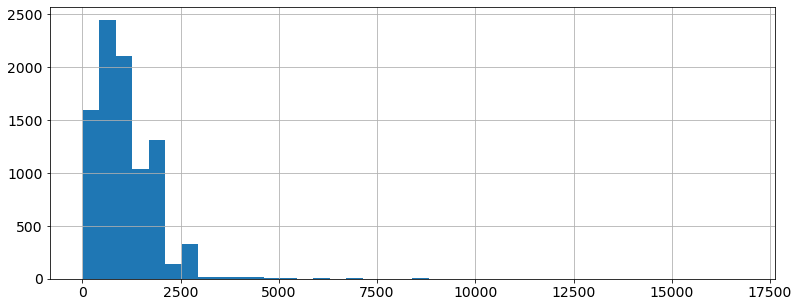

In [42]:
plt.plot(sales_train_df[sales_train_df.item_id==17717].item_price)
plt.grid()
plt.show()

plt.hist(sales_train_df[sales_train_df.item_id==17717].item_price, bins = 40)
plt.grid()
plt.show()

/Users/kirillmansurov/opt/anaconda3/lib/python3.8/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


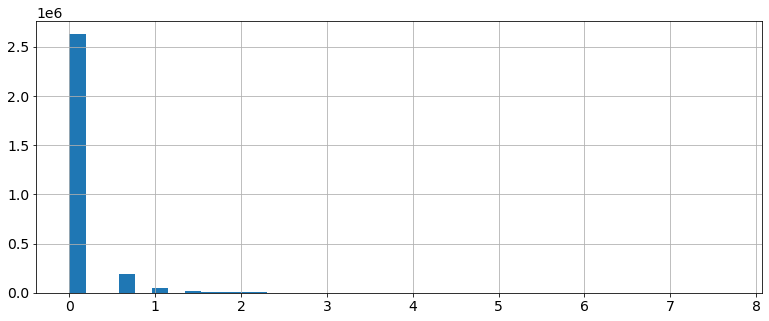

1.0       2629372
2.0        194201
3.0         47350
4.0         19685
5.0         10474
           ...   
240.0           1
502.0           1
222.0           1
1000.0          1
230.0           1
Name: item_cnt_day, Length: 198, dtype: int64


In [43]:
plt.hist(np.log(sales_train_df.item_cnt_day), bins = 40)
plt.grid()
plt.show()
print(sales_train_df.item_cnt_day.value_counts())

--------
By assumption, the price in a certain store for a certain product should not active changing:

In [44]:
agg_table_price = sales_train_df.groupby(['shop_id', 'item_id']).agg({'item_price':list}).reset_index()
agg_table_price.head()

,shop_id,item_id,item_price
0,0,30,"[265.0, 265.0, 265.0, 265.0, 265.0, 265.0, 265..."
1,0,31,"[434.0, 434.0, 434.0, 434.0, 434.0, 434.0, 434.0]"
2,0,32,"[221.0, 221.0, 221.0, 221.0, 221.0, 221.0, 221..."
3,0,33,"[347.0, 347.0, 347.0, 347.0, 347.0, 347.0]"
4,0,35,"[247.0, 247.0, 247.0, 247.0, 247.0, 247.0, 247..."


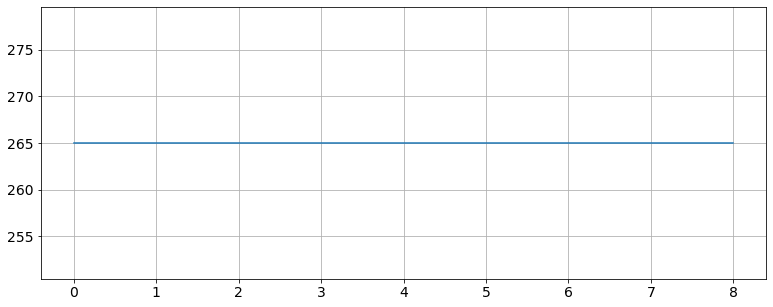

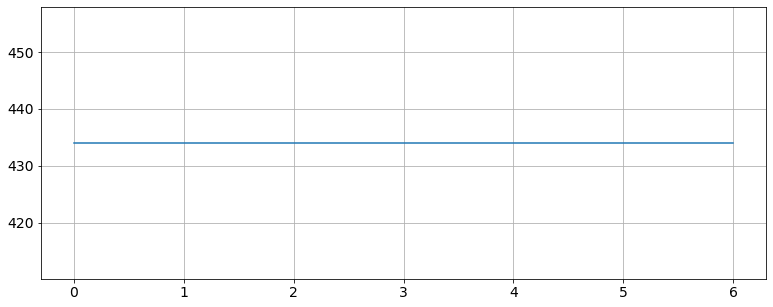

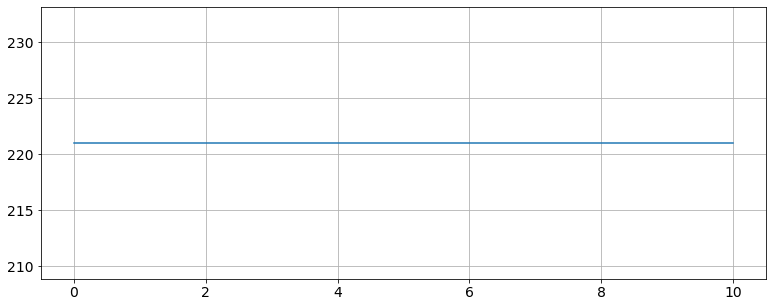

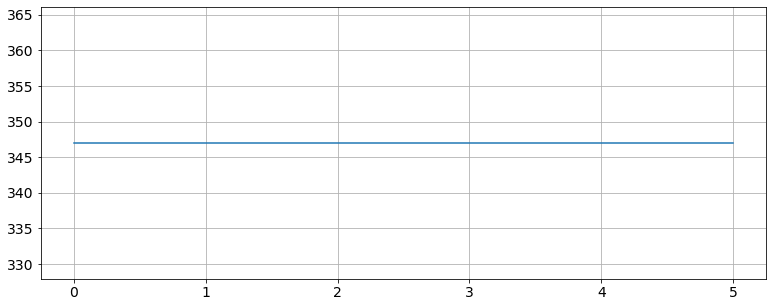

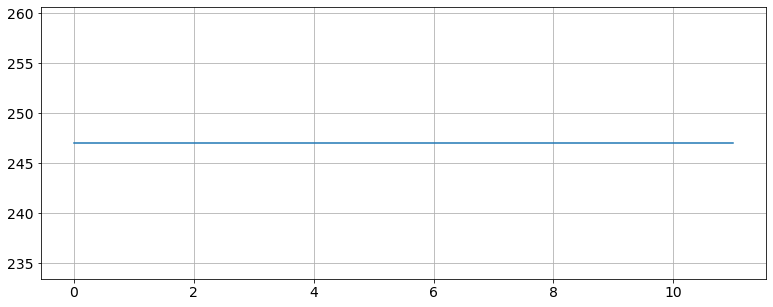

...

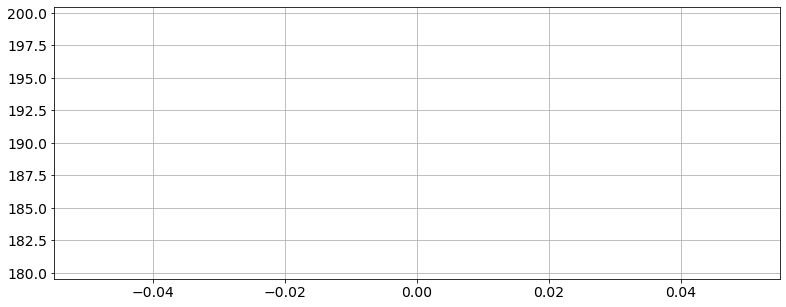

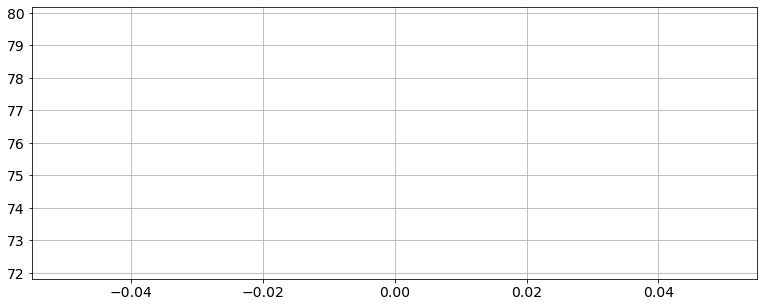

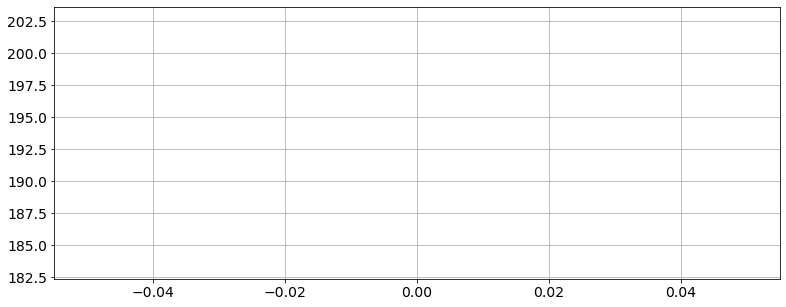

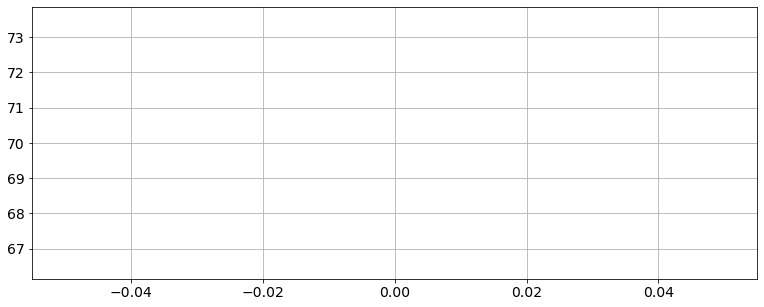

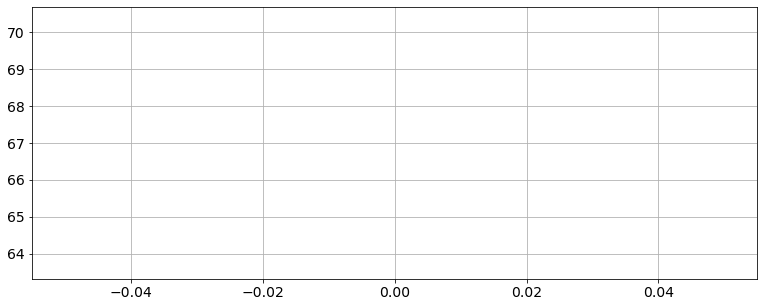

In [45]:
for k in range(20):
    plt.plot(agg_table_price.item_price.iloc[k])
    plt.grid()
    plt.show()

Lets check difference between min and max prices in shop for specific product:

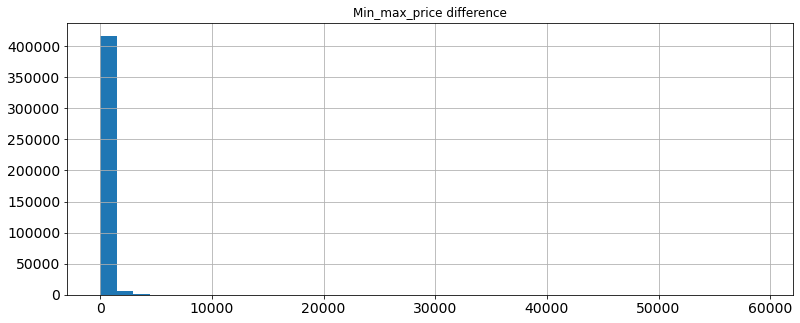

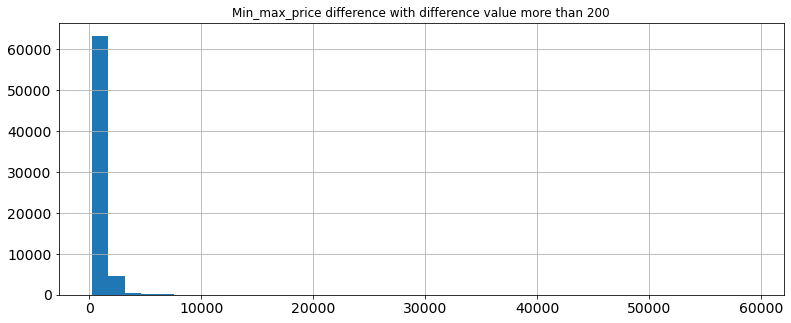

In [46]:
plt.hist(agg_table_price.item_price.apply(lambda x: max(x)-min(x)), bins = 40)
plt.title('Min_max_price difference')
plt.grid()
plt.show()

rvv = agg_table_price.item_price.apply(lambda x: max(x)-min(x))
plt.hist(rvv[rvv>200], bins = 40)
plt.title('Min_max_price difference with difference value more than 200')
plt.grid()
plt.show()

As we can see, there are exist big differences:

In [47]:
agg_table_price['min_max_diff'] = agg_table_price.item_price.apply(lambda x: max(x)-min(x))

In [48]:
agg_table_price[agg_table_price.min_max_diff>2000]

,shop_id,item_id,item_price,min_max_diff
6123,2,27,"[2499.0, 498.0]",2001.0
6183,2,948,"[2599.0, 2598.5, 2599.0, 999.0, 299.0, 299.0, ...",2300.0
6184,2,949,"[2599.0, 2598.7, 2599.0, 2598.5, 2598.5, 1299....",2300.0
6185,2,950,"[2599.0, 2599.0, 1299.5, 1324.99, 499.0, 999.0...",2300.0
6344,2,1548,"[4499.0, 4499.0, 4499.0, 4499.0, 4499.0, 3598....",2700.0
...,...,...,...,...
421085,59,13485,"[11191.0, 12990.0, 12990.0, 12990.0, 13990.0, ...",2799.0
421087,59,13487,"[13490.0, 10998.0]",2492.0
421088,59,13488,"[13990.0, 13990.0, 13990.0, 12490.0, 12691.0, ...",3299.0
421091,59,13491,"[14490.0, 14490.0, 14990.0, 14490.0, 14990.0, ...",2500.0


As we can see, there are situations, when price rapidly falling. But also we can see, that it doesnt seem like outlier. Most likely, this is promotion.  

...But there are outliers too...

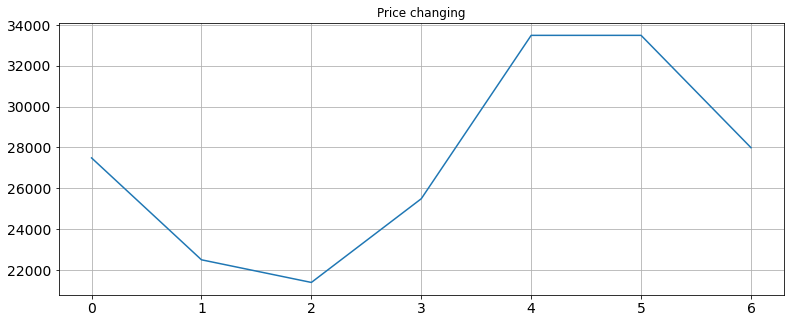

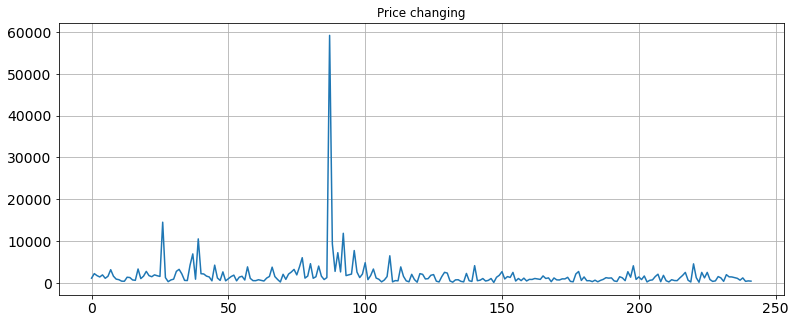

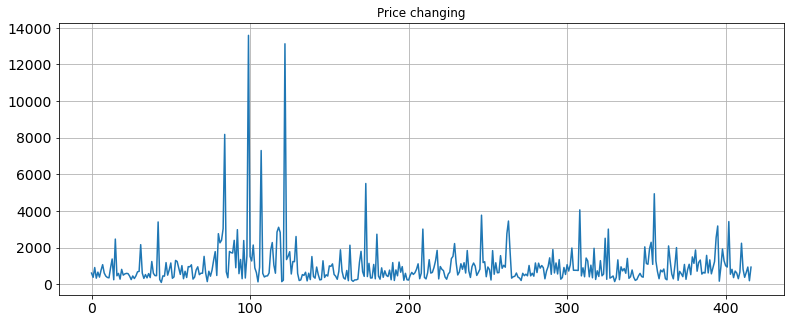

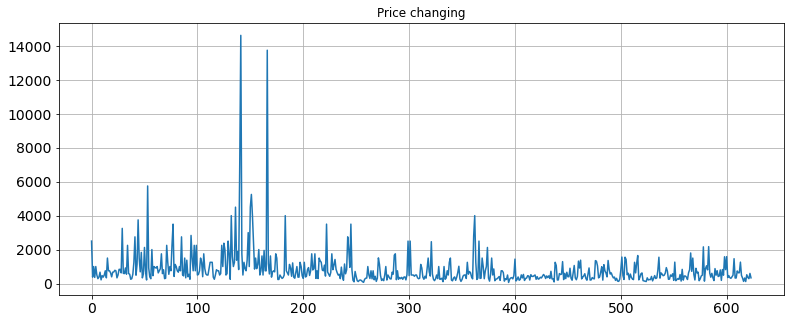

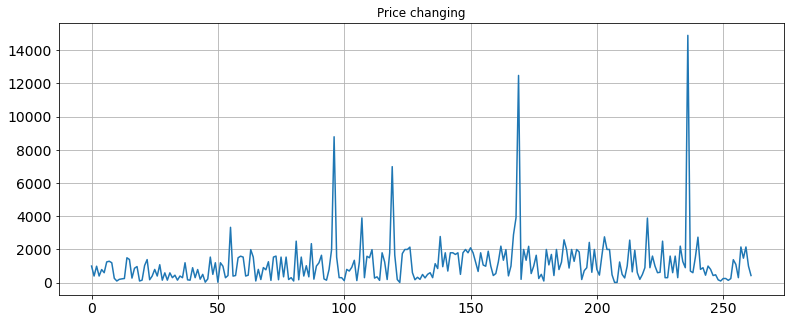

...

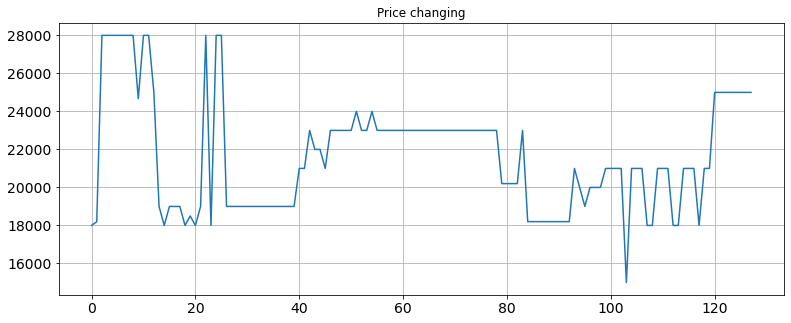

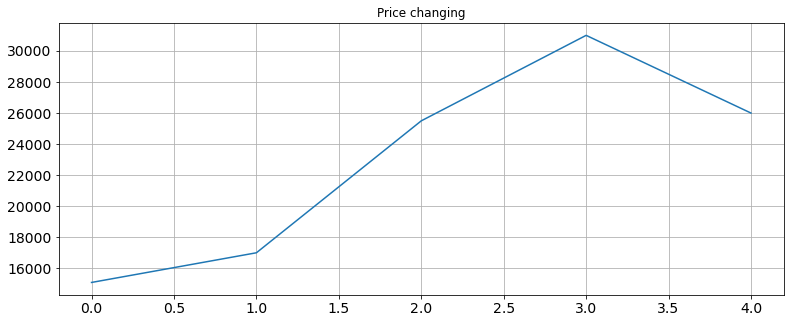

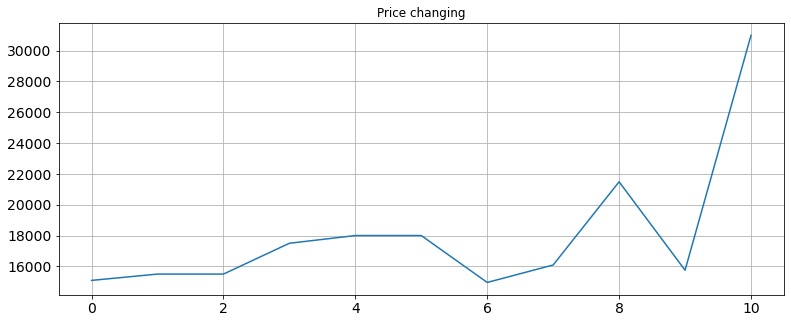

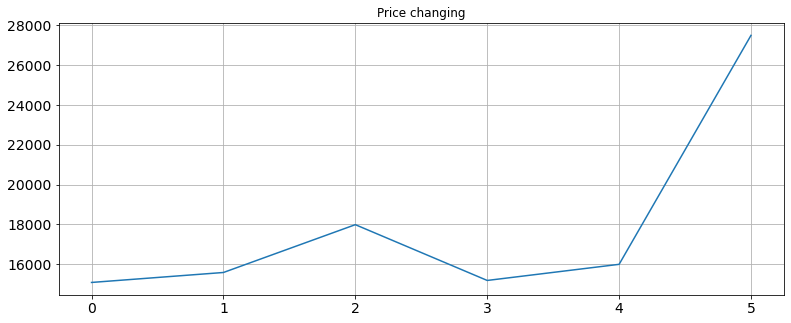

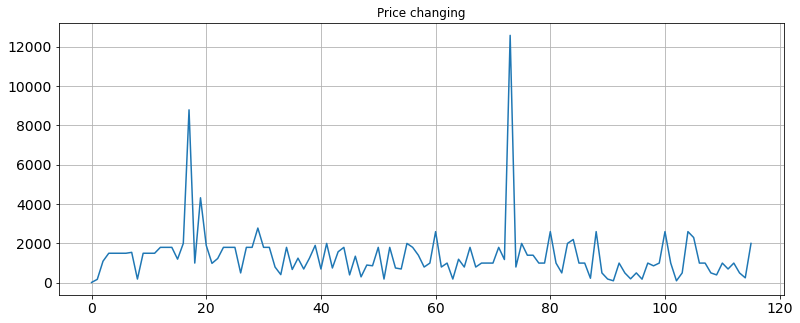

In [49]:
for val in agg_table_price[agg_table_price.min_max_diff>12000].item_price.values:
    plt.plot(val)
    plt.grid()
    plt.title('Price changing')
    plt.show()

obviously, there should be a seasonal component in time. It should be calculated...

--------

Lets talk about data preprocessing. First, we need to decide how our data will be imagine as X. I've proposed 2 scenarious: 

- Lets aggregate data by `date_block_num` parameter. Thats months implementation. Hence, we'll get something like timeseries datatable. 
- We can visualize data without aggregation by months. Instead of, we'll aggregate by `item_id`. In this case, we'll get data about items on each_day. Hence, we'll have larger timeseries data and we'll need to forecast around 30 values, instead 1. But this approach has own strongnesses too. 

Lets use first approach. But in future will be better try to use both of them.

-----------

If we've already selected our input datetype, lets build such dataframe.

In [50]:
sales_train_df_sorted = sales_train_df[sales_train_df.item_id==17717].sort_values(by='date_block_num')
sales_train_df_sorted.groupby('date_block_num').agg({'item_price': sum, 'item_cnt_day': sum})
sales_train_df_sorted.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,item_name,item_category_id,item_category_name
670592,11.01.2013,0,25,17717,1099.0,2.0,Прием денежных средств для 1С-Онлайн,79,Служебные
670659,14.01.2013,0,31,17717,1499.0,1.0,Прием денежных средств для 1С-Онлайн,79,Служебные
670658,16.01.2013,0,31,17717,999.0,1.0,Прием денежных средств для 1С-Онлайн,79,Служебные
670657,17.01.2013,0,31,17717,699.0,1.0,Прием денежных средств для 1С-Онлайн,79,Служебные
670656,23.01.2013,0,31,17717,99.0,1.0,Прием денежных средств для 1С-Онлайн,79,Служебные


In [51]:
aggregated_table = sales_train_df.groupby(['item_id', 'date_block_num']).agg({
    'item_price': sum, 'item_cnt_day': sum, 
    'item_price': sum, 'shop_id': list, 'item_name': list, 
    'item_category_id': list, 'item_category_name': list
}).reset_index()

aggregated_table.head()

,item_id,date_block_num,item_price,item_cnt_day,shop_id,item_name,item_category_id,item_category_name
0,0,20,58.0,1.0,[54],[! ВО ВЛАСТИ НАВАЖДЕНИЯ (ПЛАСТ.) D],[40],[Кино - DVD]
1,1,15,8980.0,2.0,"[55, 55]",[!ABBYY FineReader 12 Professional Edition Ful...,"[76, 76]","[Программы - Для дома и офиса (Цифра), Програм..."
2,1,18,4490.0,1.0,[55],[!ABBYY FineReader 12 Professional Edition Ful...,[76],[Программы - Для дома и офиса (Цифра)]
3,1,19,4490.0,1.0,[55],[!ABBYY FineReader 12 Professional Edition Ful...,[76],[Программы - Для дома и офиса (Цифра)]
4,1,20,4490.0,1.0,[55],[!ABBYY FineReader 12 Professional Edition Ful...,[76],[Программы - Для дома и офиса (Цифра)]


In [52]:
new_agg_table = pd.DataFrame()
for k in range(aggregated_table.shape[0]):
    new_agg_table

In [53]:
# we will not use item_name, item_price and item_categoty_name now, but it may be useful in the future
col_lenn = ['item_id']+[
    'item_price_'+str(k) for k in range(34)
    ]+[
    'item_cnt_day_'+str(k) for k in range(34)
    ]+[
    'shop_id_'+str(k) for k in range(61)
    ]+[
    'item_category_id_'+str(k) for k in range(84)
    ]

new_agg_table = pd.DataFrame(columns = col_lenn)
new_agg_table

,item_id,item_price_0,item_price_1,item_price_2,item_price_3,item_price_4,item_price_5,item_price_6,item_price_7,item_price_8,...,item_category_id_74,item_category_id_75,item_category_id_76,item_category_id_77,item_category_id_78,item_category_id_79,item_category_id_80,item_category_id_81,item_category_id_82,item_category_id_83


In [ ]:
for i in tqdm(range(22169)):
    curr_table = aggregated_table[(aggregated_table.item_id==i)]
    price_table = [curr_table[curr_table.date_block_num==k].item_price.sum() for k in range(34)]
    cnt_day_table = [curr_table[curr_table.date_block_num==k].item_cnt_day.sum() for k in range(34)]
    
    ks = list(curr_table.shop_id.explode().value_counts().keys())
    vs = list(curr_table.shop_id.explode().value_counts().values)
    shop_id_table = [0 for _ in range(61)]
    for j in range(len(ks)):
        shop_id_table[ks[j]]=vs[j]
        
    ks = list(curr_table.item_category_id.explode().value_counts().keys())
    vs = list(curr_table.item_category_id.explode().value_counts().values)
    item_category_id_table = [0 for _ in range(84)]
    for j in range(len(ks)):
        item_category_id_table[ks[j]]=vs[j]
    val = [i]+price_table+cnt_day_table+shop_id_table+item_category_id_table
    new_agg_table.loc[i] = val

 23%|████████▋                             | 5042/22169 [02:25<08:37, 33.09it/s]

In [ ]:
new_agg_table.head()

---------
# Summary

Более 90% данных из тестового набора встречаются и в train_sample. Оставшиеся данные необходимо либо отбросить, либо пометить их специальным фактором, указывающим на несостоятельность значений оставшихся факторов для них.  

Все остальные товары разбиты на категории, которые могут быть похожи между собой в той или иной степени. Некоторые категории товаров теряют, либо приобретают спрос за указанный срок. При этом множество категорий товаров имеет тренд, а так же фактор сезонности. Из этого можно сделать вывод, что в дальнейшем, при создании модели будет полезным выделить тренд из тех категорий товаров, в которых он есть и описывать его отдельным фактором, либо просто учитывать ранее вычисленные его значения при прогнозировании. Так же необходимы факторы для учёта сезонности. Как показали величины сезонности, она выделяется во временах года, месяцах, днях недели, а так же выходных и праздниках. Отдельно стоит выделить предновогодние дни. У большинства товаров продажи в эти дни растут.  

Объём проданного товара сильно зависит от цен, которые на него установлены. Было выяснено, что на некоторые товары цены меняются чаще и активнее, чем на другие. Это зависит как от магазинов, которые их продают, так и от самих типов товаров. При этом выяснилось, что чем ниже цена на товар, тем чаще и активнее меняется его цена, а более дешёвые товары имеют более частый спрос, чем дорогие

При оценке магазинов наблюдается похожая тенденция, как и на категории товаров. Многие магазины имеют тренд по продажам, некоторые из них имеют сезонность. Часть магазинов начала изи закончила продавать товары в указанный период. Данное наблюдение только подтверждает необходимость добавления фичей, связанных с сезонностью и трендом.  

Так же некоторые магазины имеют всегда фиксированную цену на товары, а некоторе магазины часто её меняют. Таким образом, некоторые магазины можно назвать магазинами с плавающими ценами, а некоторые магазинами с фиксированными.  

В дальнейшем возможны 2 варианта представления данных. Предлагается добавить фичи показателя тренда для каждого из товаров. Так же следует сделать фичи показателя сезонности, показателя спроса для каждого товара, показателя относительной величины цены, показателя типа магазина (плавающая цена или нет) и пр. Далее можно представить данные в 2 типах: это как агрегированные данные для товара на весь месяц, либо как предсказание данных на каждый день с последующей аггрегацией. Можно составить 2 модели.